# Random Forest Model + Explainable AI Techniques (XAI)

## Import and Reading Data

In [1]:
import pandas as pd
import numpy as np
import joblib
import matplotlib.pyplot as plt

from sklearn import metrics
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

Load Train Dataset

In [2]:
df_train = pd.read_csv("../0_Datasets/IoMT_AI_IDS/Flows/train.csv")

In [3]:
display(df_train)

,fwd_pkts_tot,bwd_pkts_tot,fwd_data_pkts_tot,bwd_data_pkts_tot,fwd_pkts_per_sec,bwd_pkts_per_sec,flow_pkts_per_sec,down_up_ratio,fwd_header_size_tot,fwd_header_size_min,...,flow_pkts_payload.max,flow_pkts_payload.tot,flow_pkts_payload.avg,flow_pkts_payload.std,fwd_subflow_pkts,bwd_subflow_pkts,fwd_subflow_bytes,bwd_subflow_bytes,traffic,is_attack
0,-0.674434,-0.621972,-0.450908,-0.746950,-0.572718,-0.467121,-0.530517,0.232052,-0.680179,0.002967,...,-0.517239,-0.823663,-0.557857,-0.528041,-0.792487,-0.886108,-0.805688,-0.992819,normal,0
1,-0.722124,-0.725850,-0.546365,-0.746950,-0.572239,-0.466783,-0.530104,0.232052,-0.727991,0.002967,...,-0.517239,-0.824912,-0.557857,-0.527991,-0.792487,-0.886108,-0.805688,-0.992819,normal,0
2,-0.674434,-0.621972,-0.450908,-0.746950,-0.572705,-0.467112,-0.530505,0.232052,-0.680179,0.002967,...,-0.517239,-0.823663,-0.557857,-0.528041,-0.792487,-0.886108,-0.805688,-0.992819,normal,0
3,-0.674434,-0.621972,-0.450908,-0.746950,-0.572649,-0.467072,-0.530456,0.232052,-0.680179,0.002967,...,-0.517239,-0.823663,-0.557857,-0.528041,-0.792487,-0.886108,-0.805688,-0.992819,normal,0
4,-0.865193,-0.933607,-0.928195,-0.746950,-0.054334,0.273648,0.143245,2.515023,-0.871428,0.002967,...,-0.519508,-0.829911,-0.565532,-0.531550,-0.792487,-0.788171,-0.806943,-0.992819,rudeadyet,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60883,-0.674434,-0.621972,-0.450908,-0.746950,-0.572671,-0.467088,-0.530476,0.232052,-0.680179,0.002967,...,-0.517239,-0.823663,-0.557857,-0.528041,-0.792487,-0.886108,-0.805688,-0.992819,normal,0
60884,1.471606,1.455598,1.458239,1.467491,-0.477501,-0.437955,-0.471839,-0.909433,1.471377,0.002967,...,-0.448033,0.111859,-0.411279,-0.439380,1.486861,1.464372,0.118161,0.190744,mqttmalaria,1
60885,-0.722124,-0.829729,-0.832738,-0.658372,1.287170,0.515371,0.866938,-0.338691,-0.716038,0.002967,...,-0.392819,-0.695789,-0.330161,-0.356992,-0.652935,-0.690234,-0.736859,2.664391,rudeadyet,1
60886,-0.674434,-0.621972,-0.450908,-0.746950,-0.572663,-0.467082,-0.530469,0.232052,-0.680179,0.002967,...,-0.517239,-0.823663,-0.557857,-0.528041,-0.792487,-0.886108,-0.805688,-0.992819,normal,0


Load Test Dataset

In [4]:
df_test = pd.read_csv("../0_Datasets/IoMT_AI_IDS/Flows/test.csv")

In [5]:
display(df_test)

,fwd_pkts_tot,bwd_pkts_tot,fwd_data_pkts_tot,bwd_data_pkts_tot,fwd_pkts_per_sec,bwd_pkts_per_sec,flow_pkts_per_sec,down_up_ratio,fwd_header_size_tot,fwd_header_size_min,...,flow_pkts_payload.max,flow_pkts_payload.tot,flow_pkts_payload.avg,flow_pkts_payload.std,fwd_subflow_pkts,bwd_subflow_pkts,fwd_subflow_bytes,bwd_subflow_bytes,traffic,is_attack
0,-0.817503,-0.933607,-0.737280,-0.746950,-0.482514,-0.403444,-0.452983,0.232052,-0.823616,0.002967,...,-0.509298,-0.818664,-0.530994,-0.514251,-0.745970,-0.788171,-0.795646,-0.992819,slowloris,1
1,-0.579055,-0.414215,-0.641823,-0.658372,0.552561,0.327246,0.436698,0.232052,-0.572601,0.002967,...,2.218502,1.967492,1.889052,1.878208,-0.513383,-0.298488,1.971296,0.806197,apachekiller,1
2,-0.674434,-0.621972,-0.450908,-0.746950,-0.572623,-0.467054,-0.530434,0.232052,-0.680179,0.002967,...,-0.517239,-0.823663,-0.557857,-0.528041,-0.792487,-0.886108,-0.805688,-0.992819,normal,0
3,-0.674434,-0.621972,-0.450908,-0.746950,-0.572631,-0.467059,-0.530441,0.232052,-0.680179,0.002967,...,-0.517239,-0.823663,-0.557857,-0.528041,-0.792487,-0.886108,-0.805688,-0.992819,normal,0
4,-0.674434,-0.621972,-0.450908,-0.746950,-0.572633,-0.467061,-0.530443,0.232052,-0.680179,0.002967,...,-0.517239,-0.823663,-0.557857,-0.528041,-0.792487,-0.886108,-0.805688,-0.992819,normal,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20291,-0.674434,-0.621972,-0.450908,-0.746950,-0.572961,-0.467292,-0.530725,0.232052,-0.680179,0.002967,...,-0.517239,-0.823663,-0.557857,-0.528041,-0.792487,-0.886108,-0.805688,-0.992819,normal,0
20292,-0.674434,-0.621972,-0.450908,-0.746950,-0.572624,-0.467055,-0.530436,0.232052,-0.680179,0.002967,...,-0.517239,-0.823663,-0.557857,-0.528041,-0.792487,-0.886108,-0.805688,-0.992819,slowloris,1
20293,-0.579055,-0.414215,-0.641823,-0.658372,0.564715,0.335826,0.447145,0.232052,-0.572601,0.002967,...,2.218502,1.949165,1.872970,1.893964,-0.513383,-0.298488,1.952886,0.806197,apachekiller,1
20294,-0.626744,-0.518094,-0.737280,-0.658372,0.407513,0.224853,0.312025,0.232052,-0.620413,0.002967,...,2.218502,1.936669,2.266596,2.316445,-0.559901,-0.396424,1.940334,0.806197,apachekiller,1


-----
## Create Model and Train Model

Drop Multiclass Column

In [6]:
df_train = df_train.drop('traffic', axis=1)
df_test = df_test.drop('traffic', axis=1)

Excluding the target variable

In [7]:
X_columns = df_train.columns.drop('is_attack')

Create a feature matrix X by selecting only the columns specified in X_columns. Then convert the selected data into a NumPy array.

In [8]:
X = df_train[X_columns].values

Creates a target variable y containing the target variable

In [9]:
y = df_train["is_attack"].values

Split into training and testing sets

In [10]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42, stratify=y)

-------

# Explainable AI Techniques (XAI)

Load Previous Trained Model

In [11]:
# Load the saved Random Forest model
model_folder = "../2_Modeling_Phase/Binary/Saved-Models/"
model_filename = "IoMT_AI_IDS_RF_Random_Forest_Model.joblib"
model_path = model_folder + model_filename

model = joblib.load(model_path)

Get Features Names and Class Names

In [12]:
feature_names = list(X_columns)
class_names = ["Normal", "Malicious"]

## LIME

Cenerate locally interpretable explanations for the predictions of machine learning models by approximating their behavior with simpler, interpretable models at the instance level.

Works by generating perturbed instances around a specific data point of interest and observing the corresponding predictions of the black-box model. It then fits a simpler, interpretable model (such as linear regression or decision tree) to explain the predictions of the black-box model based on the perturbed data.

In [13]:
#!pip install lime
#!pip install interpret

In [14]:
import lime
from interpret.blackbox import LimeTabular
from lime.lime_tabular import LimeTabularExplainer
from interpret import show

Create a LIME instance for Tabular Explainer for explaining predictions of the machine learning model

In [15]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=feature_names, class_names=class_names, discretize_continuous=True)

Generate an explanation for a specific instance in the test set.

In [16]:
i = np.random.randint(0, X_test.shape[0])
exp = explainer.explain_instance(X_test[i], model.predict_proba, num_features=10, top_labels=1)
exp.show_in_notebook(show_table=True, show_all=False)

Generate local explanations for a batch of instances from the test set.

In [17]:
lime = LimeTabular(model=model, data=X_train, feature_names=feature_names, class_names=class_names)
lime_local = lime.explain_local(X_test[-50:], y_test[-50:], name='LIME')

show(lime_local)

<!-- http://127.0.0.1:7001/1347742885392/ -->

## SHAP

Explainins the output of machine learning models, providing insights into the role of each feature in individual predictions. It balances the contributions of features, offering a view of feature importance.

In [18]:
import shap

shap.initjs()

Generate the Explainer

In [19]:
explainer = shap.TreeExplainer(model)

shap_values will contain the computed SHAP values for the features of the selected instance. Positive values indicate a positive impact on the prediction, while negative values indicate a negative impact.

In [20]:
start_index = 0
end_index = 1

shap_values = explainer.shap_values(X_test[start_index:end_index])

In [21]:
# class 0 = contribution to class 'Normal'
# class 1 = contribution to class 'Malicious'
print(shap_values[0].shape)
shap_values

(1, 33)


[array([[ 1.40417821e-05,  1.38508184e-02,  3.45676812e-02,
          0.00000000e+00,  6.44831103e-02, -7.56467338e-03,
          9.96433399e-03,  6.56655460e-05, -8.73410702e-04,
          1.33872245e-06,  2.34683986e-05,  3.45189860e-03,
          1.60620499e-06,  6.37724656e-06,  1.06334877e-01,
          4.87019368e-02,  3.59243954e-02,  1.44142565e-02,
          1.53654756e-02, -9.03366305e-06, -1.70894632e-03,
          1.03709179e-05,  3.07550443e-03,  0.00000000e+00,
          1.38368827e-05,  5.04026124e-02,  1.91735818e-02,
          1.65995745e-03,  1.56299586e-02,  6.46937418e-05,
          9.58400375e-02,  1.08447863e-03,  2.56270922e-04]]),
 array([[-1.40417821e-05, -1.38508184e-02, -3.45676812e-02,
          0.00000000e+00, -6.44831103e-02,  7.56467338e-03,
         -9.96433399e-03, -6.56655460e-05,  8.73410702e-04,
         -1.33872245e-06, -2.34683986e-05, -3.45189860e-03,
         -1.60620499e-06, -6.37724656e-06, -1.06334877e-01,
         -4.87019368e-02, -3.59243954

In [22]:
class_labels = ['normal', 'malicious']  # Replace with your actual class labels

prediction = model.predict(X_test[start_index:end_index])[0]

predicted_class_label = class_labels[int(prediction)]
print(f'The predicted class is: {predicted_class_label}')

The predicted class is: normal


Contributions of each feature to the model's prediction for a specific instance.

The RF predicted: 0


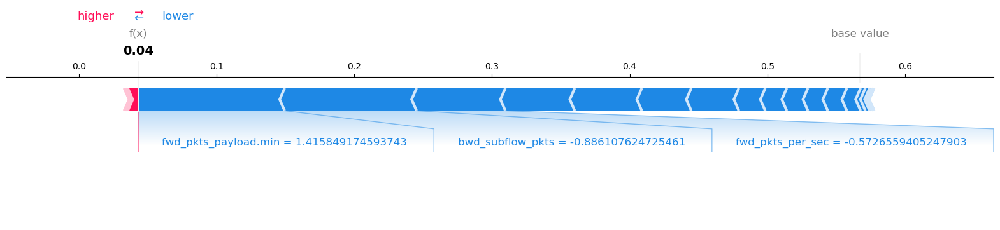

In [23]:
shap.initjs()

prediction = model.predict(X_test[start_index:end_index])[0]
print(f"The RF predicted: {prediction}")

shap.force_plot(explainer.expected_value[1],
                      shap_values[1],
                      X_test[start_index:end_index],
                      feature_names=feature_names,
                      matplotlib=True)

#### shap.Explainer(model)

- This is a generic explainer that can be used with any type of machine learning model.
- It is model-agnostic and can handle a wide range of model types, including linear models, neural networks, and more.
- It approximates the Shapley values using a sampling approach, which might be computationally expensive for complex models or large datasets.

#### shap.TreeExplainer(model)

- This explainer is specifically designed for tree-based models, such as decision trees, random forests, and gradient boosting machines.
- It leverages the exact Shapley value computation for tree ensembles, making it computationally efficient for tree-based models.
- It provides accurate and faster Shapley values for tree models.

The plot visualizes the impact of each feature on the model's output for the specified instance.

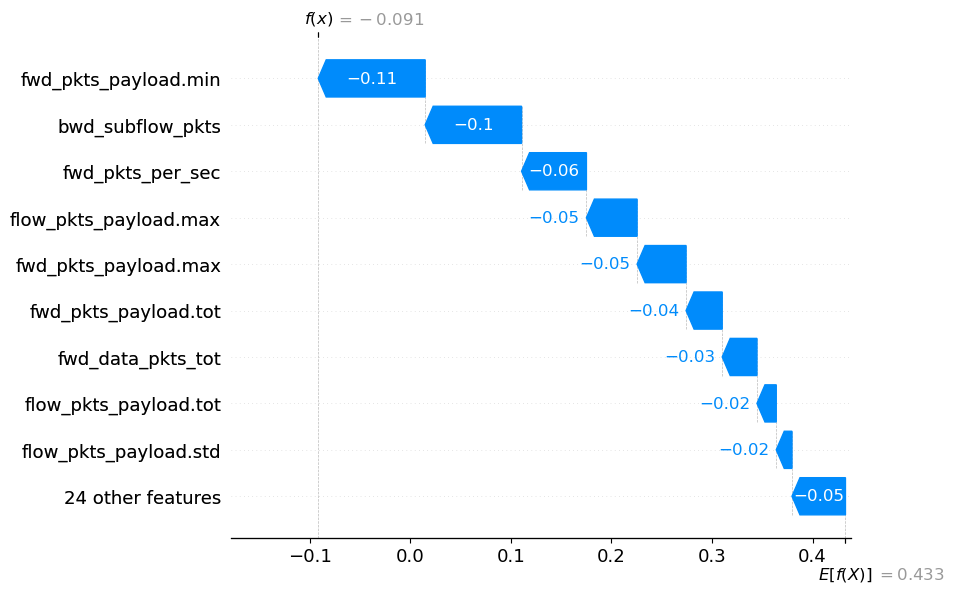

In [24]:
#explainer = shap.Explainer(model)
explainer = shap.TreeExplainer(model)

shap_values = explainer.shap_values(X_test[start_index:end_index])
base_value = explainer.expected_value

# Change shap_values[0] or shap_values[0], if you want explaination for 'Normal' or 'Malicious'
explanation = shap.Explanation(values=shap_values[1], base_values=base_value,feature_names=feature_names)

shap.plots.waterfall(explanation[0])

Explain the output of machine learning models by attributing the contribution of each feature to the model's prediction.

In [25]:
start_index = 1
end_index = 50

ex = shap.KernelExplainer(model.predict,shap.sample(X_train,100))
shap_values = explainer.shap_values(X_test[start_index:end_index])
shap.force_plot(explainer.expected_value[1], shap_values[1], X_test[start_index:end_index],feature_names=feature_names)

Gain insights into which features have the most significant impact on model predictions across the dataset.

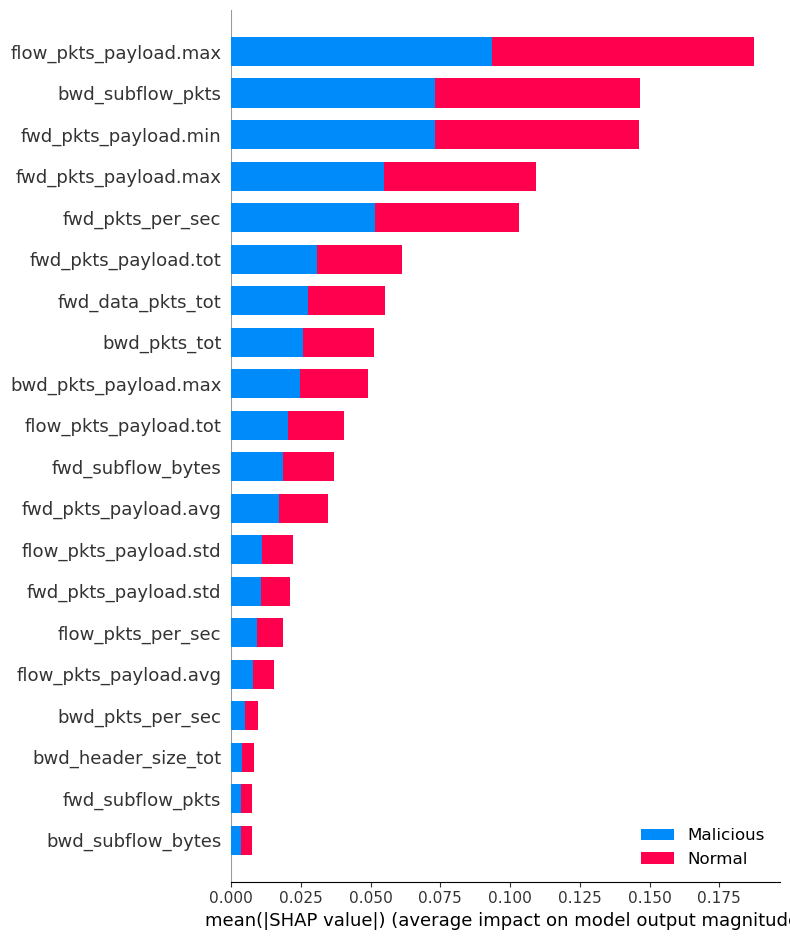

In [26]:
shap.summary_plot(shap_values, X_test,feature_names=feature_names,class_names=class_names)

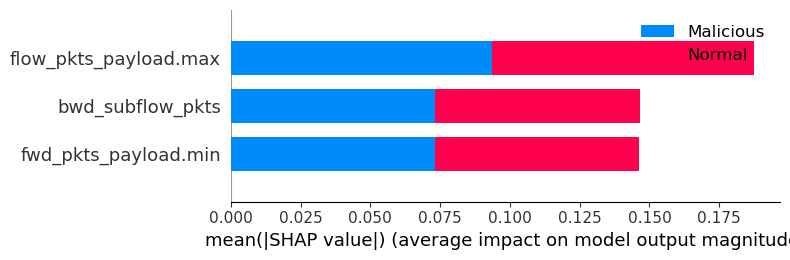

In [27]:
shap.summary_plot(shap_values, X, max_display=3,feature_names=feature_names,class_names=class_names)

Kernel SHAP explainer to compute SHAP values for a subset of instances.
Creates a summary plot to visualize the overall impact of features on model predictions for those instances.

In [28]:
ex = shap.KernelExplainer(model.predict,shap.sample(X_train,100))

  0%|          | 0/49 [00:00<?, ?it/s]

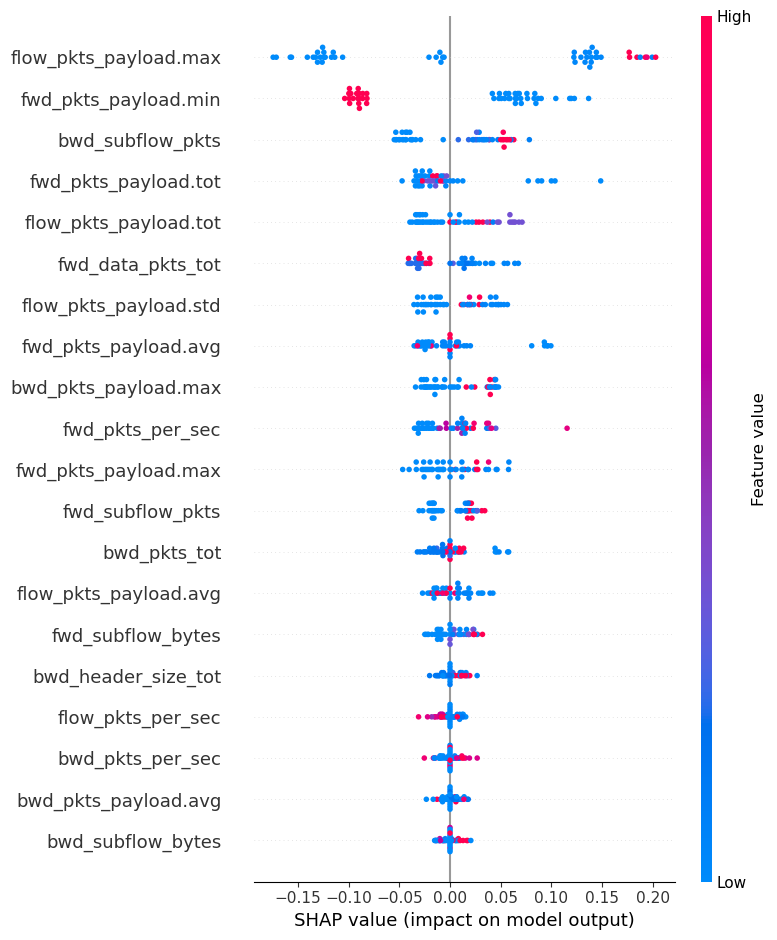

In [29]:
start_index = 1
end_index = 50

shap_values = ex.shap_values(X_test[start_index:end_index])
shap.summary_plot(shap_values, X_test[start_index:end_index],feature_names=feature_names)

In [30]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)

SHAP dependence plots show the effect of a single feature across the whole dataset. They plot a feature's value vs. the SHAP value of that feature across many samples. SHAP dependence plots are similar to partial dependence plots, but account for the interaction effects present in the features, and are only defined in regions of the input space supported by data. The vertical dispersion of SHAP values at a single feature value is driven by interaction effects, and another feature is chosen for coloring to highlight possible interactions.

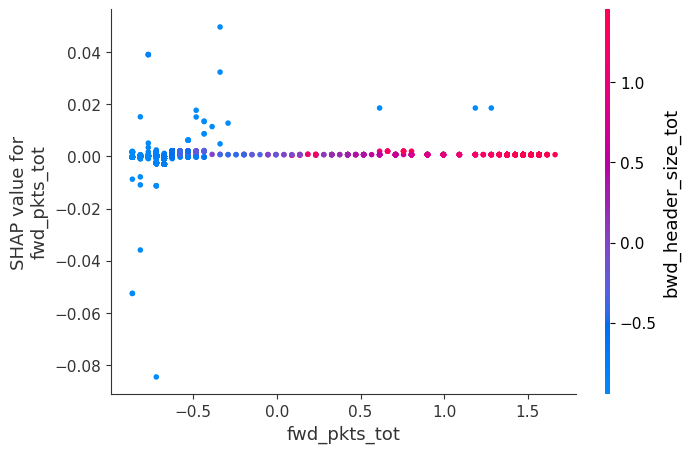

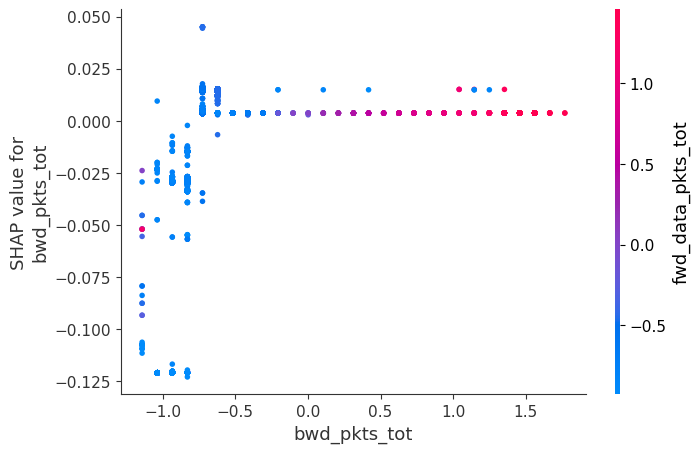

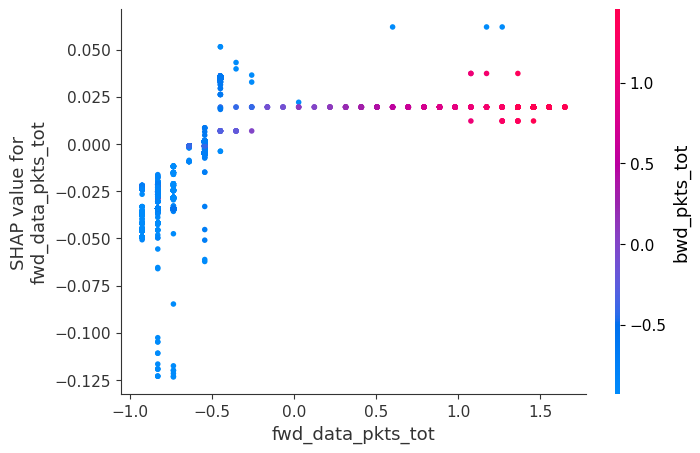

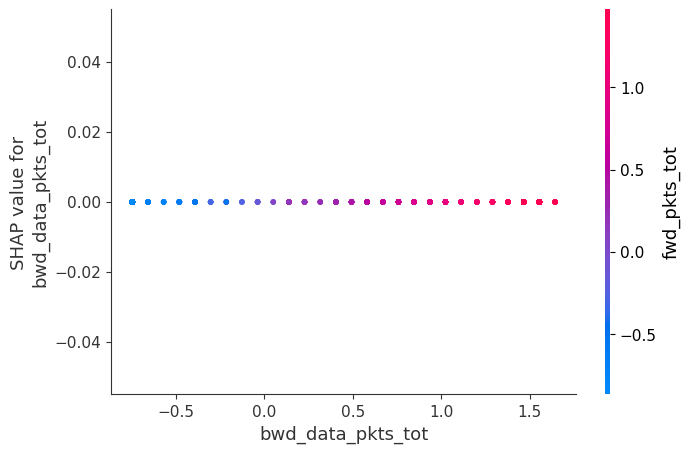

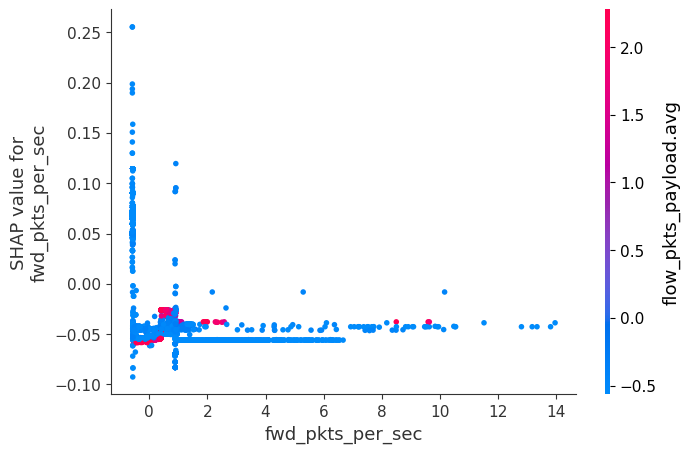

...

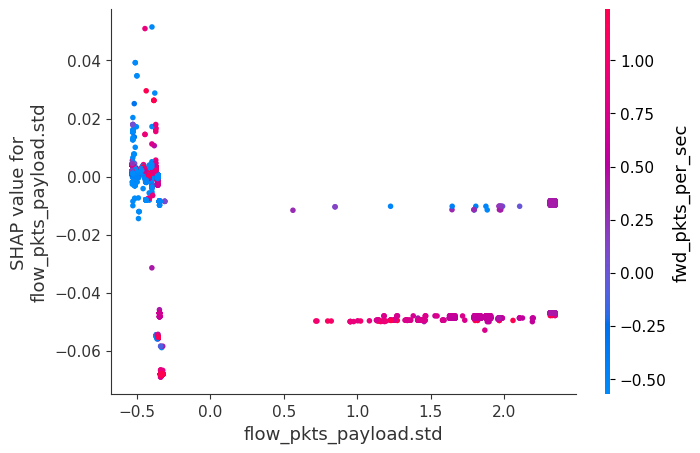

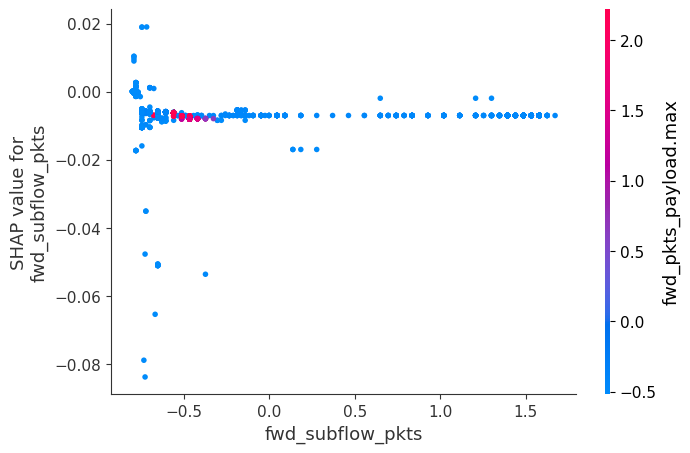

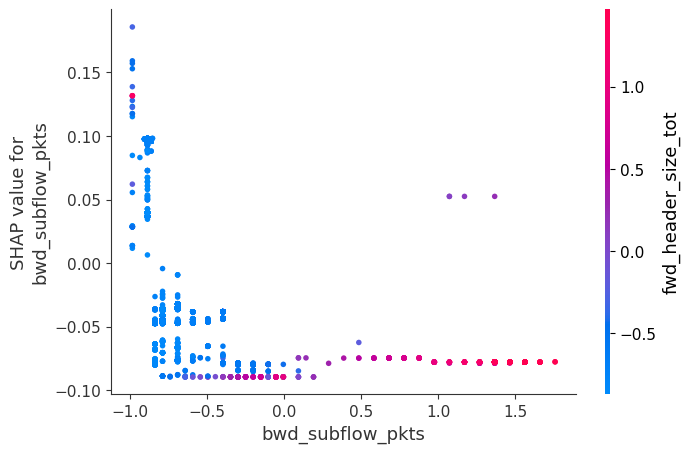

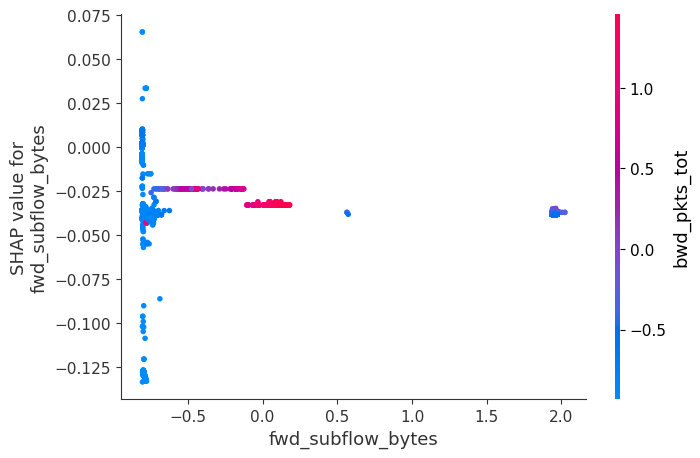

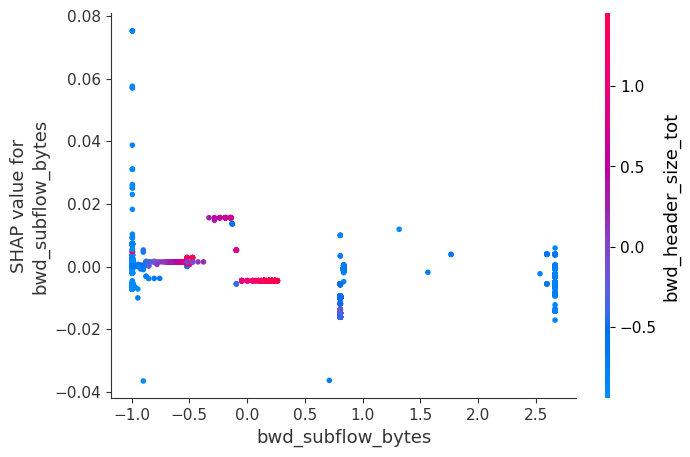

In [31]:
for i in feature_names:
    shap.dependence_plot(
        i, 
        shap_values[0], 
        X_test, 
        feature_names=feature_names)

## Shapash

Understanding model with shapash

In [32]:
#!pip install shapash

In [33]:
from shapash import SmartExplainer

In [34]:
X_test_df = pd.DataFrame(X_test, columns=feature_names)

pred = model.predict(X_test)

# Since both are one-dimensional NumPy arrays
pred_series = pd.Series(pred)
y_target_series = pd.Series(y_test)

In [35]:
xpl = SmartExplainer(model=model)
xpl.compile(x=X_test_df,
            y_pred=pred_series,
            y_target=y_target_series)

INFO: Shap explainer type - <shap.explainers._tree.TreeExplainer object at 0x00000139D7DF0E90>


In [36]:
feature_names[25]

'flow_pkts_payload.max'

Display features importance

In [37]:
xpl.plot.features_importance()

Focus on a specific subset

In [38]:
subset = [ 168, 54, 995, 799, 310, 322, 1374,
          1106, 232, 645, 1170, 1229, 703, 66,
          886, 160, 191, 1183, 1037, 991, 482,
          725, 410, 59, 28, 719, 337, 36]

xpl.plot.features_importance(selection=subset)

Understand how a feature contributes

In [39]:
xpl.plot.contribution_plot('flow_pkts_payload.max')

X has feature names, but RandomForestClassifier was fitted without feature names


Display a Summarized but Explicit local explainability

Filter method
- max_contrib : maximum number of criteria to display 
- threshold : minimum value of the contribution (in absolute value) necessary to display a criterion 
- positive : display only positive contribution? Negative?(default None) 
- features_to_hide : list of features you don’t want to display

In [40]:
xpl.filter(max_contrib=8,threshold=100)

In [41]:
xpl.plot.local_plot(index=560)

Using Shapash with FastTreeSHAP explainer (Packages Not Working)

https://shapash.readthedocs.io/en/latest/tutorials/explainer_and_backend/tuto-expl05-Shapash-using-Fasttreeshap.html

Contributions comparing plot

https://shapash.readthedocs.io/en/latest/tutorials/plots_and_charts/tuto-plot04-compare_plot.html

In [42]:
from shapash.explainer.smart_explainer import SmartExplainer

In [43]:
response_dict = {0: 'Normal', 1: 'Malicious'}

In [44]:
xpl = SmartExplainer(model=model,
                     label_dict=response_dict) # Optional parameters, dicts specify labels

In [45]:
y_pred = pd.DataFrame(model.predict(X_test_df),columns=['pred'],index=X_test_df.index)

xpl.compile(
    x=X_test_df,
    y_pred=y_pred # Optional
)

X has feature names, but RandomForestClassifier was fitted without feature names


INFO: Shap explainer type - <shap.explainers._tree.TreeExplainer object at 0x00000139D84871D0>


In [46]:
xpl.plot.compare_plot(index=[X_test_df.index[7], X_test_df.index[10]])

X has feature names, but RandomForestClassifier was fitted without feature names


In [47]:
xpl.plot.compare_plot(row_num=[0, 1, 2, 3, 4], max_features=8)

In [48]:
xpl.plot.compare_plot(row_num=[8, 17], show_predict=False, max_features=100)

scatter_plot_prediction

https://shapash.readthedocs.io/en/latest/tutorials/plots_and_charts/tuto-plot06-prediction_plot.html

In [49]:
from shapash import SmartExplainer

In [50]:
response_dict = {0: 'Normal', 1: 'Malicious'}

In [51]:
xpl_classifier = SmartExplainer(model=model,label_dict=response_dict)

In [52]:
xpl_classifier.compile(x=X_test_df,y_target=y_target_series)

INFO: Shap explainer type - <shap.explainers._tree.TreeExplainer object at 0x00000139D83868D0>


In [53]:
xpl_classifier.plot.scatter_plot_prediction()

X has feature names, but RandomForestClassifier was fitted without feature names
X has feature names, but RandomForestClassifier was fitted without feature names


## ELI5

https://coderzcolumn.com/tutorials/machine-learning/how-to-use-eli5-to-understand-sklearn-models-their-performance-and-their-predictions#struct_regression

In [54]:
#!pip install eli5

In [55]:
#from eli5 import show_weights

In [56]:
#show_weights(model, feature_names=boston.feature_names)

## Interpret ML

- https://github.com/interpretml/interpret/
- https://interpret.ml/docs/blackbox.html

With Shapley Additive Explanations (SHAP)

In [57]:
from interpret import set_visualize_provider
from interpret.provider import InlineProvider
set_visualize_provider(InlineProvider())

from interpret import show
from interpret.blackbox import ShapKernel

from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline

In [72]:
pca = PCA()

blackbox_model = Pipeline([('pca', pca), ('rf', model)])
blackbox_model.fit(X_train, y_train)

shap = ShapKernel(blackbox_model, X_train[:200],feature_names=feature_names)
shap_local = shap.explain_local(X_test[:5], y_test[:5])

show(shap_local, 0)

INFO:interpret.utils._unify_data:Unifying data
INFO:interpret.utils._unify_data:Unifying data


  0%|          | 0/5 [00:00<?, ?it/s]

INFO:shap:num_full_subsets = 1
INFO:shap:remaining_weight_vector = array([0.17443519, 0.12030013, 0.09344742, 0.07752675, 0.06709046,
       0.05980635, 0.054511  , 0.05056092, 0.04757323, 0.04530784,
       0.0436088 , 0.04237292, 0.04153219, 0.04104357, 0.04088325])
INFO:shap:num_paired_subset_sizes = 15
INFO:shap:weight_left = 0.74368134682094
INFO:shap:np.sum(w_aug) = 32.0
INFO:shap:np.sum(self.kernelWeights) = 0.9999999999999999
INFO:shap:phi = array([-0.01462095, -0.02179631, -0.00387068, -0.04123215, -0.05562675,
       -0.02927792, -0.04773881, -0.0206549 , -0.00877726,  0.01515851,
       -0.00900691, -0.00181841, -0.00955819, -0.01363991, -0.09228428,
       -0.02590713, -0.01181568, -0.03742862, -0.01121377,  0.        ,
        0.        , -0.02831172, -0.02496126,  0.        ,  0.        ,
       -0.00279497, -0.00460889, -0.00694935, -0.02226191,  0.        ,
       -0.02983373, -0.0118386 ])
INFO:shap:num_full_subsets = 1
INFO:shap:remaining_weight_vector = array([0.1744

With Local Interpretable Model-agnostic Explanations (LIME) 

In [61]:
from interpret.blackbox import LimeTabular

In [71]:
lime = LimeTabular(blackbox_model, X_train[:200],feature_names=feature_names)

show(lime.explain_local(X_test[:5], y_test[:5]), 0)

INFO:interpret.utils._unify_data:Unifying data
INFO:interpret.utils._unify_data:Unifying data


With Partial Dependence Plot

In [64]:
from interpret.blackbox import PartialDependence

In [70]:
pdp = PartialDependence(blackbox_model, X_train[:200],feature_names=feature_names)

show(pdp.explain_global(), 0)

INFO:interpret.utils._unify_data:Unifying data


With Morris Sensitivity Analysis

In [67]:
from interpret.blackbox import MorrisSensitivity

In [69]:
msa = MorrisSensitivity(blackbox_model, X_train,feature_names=feature_names)

show(msa.explain_global())

INFO:interpret.utils._unify_data:Unifying data
